In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from pylab import rcParams
import warnings
import seaborn as sns
rcParams["figure.figsize"]=(30,18)
plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.weight'] = 'bold'
plt.rcParams['font.size'] = 15
warnings.filterwarnings("ignore")
warnings.simplefilter(action='ignore', category=FutureWarning)


In [3]:
Data=pd.read_csv("/kaggle/input/materials/material.csv")

In [4]:
Data

,Material,Su,Sy,E,G,mu,Ro,Use
0,ANSI Steel SAE 1015 as-rolled,421,314,207000,79000,0.30,7860,True
1,ANSI Steel SAE 1015 normalized,424,324,207000,79000,0.30,7860,True
2,ANSI Steel SAE 1015 annealed,386,284,207000,79000,0.30,7860,True
3,ANSI Steel SAE 1020 as-rolled,448,331,207000,79000,0.30,7860,True
4,ANSI Steel SAE 1020 normalized,441,346,207000,79000,0.30,7860,True
...,...,...,...,...,...,...,...,...
1547,JIS Nodular cast iron,600,370,169000,70000,0.20,7160,False
1548,JIS Nodular cast iron,700,420,169000,70000,0.20,7160,False
1549,JIS Nodular cast iron,800,480,169000,70000,0.20,7160,False
1550,JIS Malleable cast iron,400,180,160000,64000,0.27,7160,False


In [5]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1552 entries, 0 to 1551
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Material  1552 non-null   object 
 1   Su        1552 non-null   int64  
 2   Sy        1552 non-null   int64  
 3   E         1552 non-null   int64  
 4   G         1552 non-null   int64  
 5   mu        1552 non-null   float64
 6   Ro        1552 non-null   int64  
 7   Use       1552 non-null   bool   
dtypes: bool(1), float64(1), int64(5), object(1)
memory usage: 86.5+ KB


In [6]:
Data.isnull().sum()

,0
Material,0
Su,0
Sy,0
E,0
G,0
mu,0
Ro,0
Use,0


In [7]:
Data.duplicated().sum()

4

In [8]:
df=Data.copy()

In [9]:
duplicated_rows = df[df.duplicated()]
duplicated_names = duplicated_rows['Material'].unique()
print(duplicated_names)


['NF NF XC42TS ' 'NF NF XC55H1 ' 'NF NF Z15CN2413 ' 'NF NF Z12CNS2520 ']


In [10]:
df.drop_duplicates(inplace=True)

In [11]:
duplicated_rows = df[df.duplicated()]
duplicated_names = duplicated_rows['Material'].unique()
print(duplicated_names)


[]


In [12]:
df

,Material,Su,Sy,E,G,mu,Ro,Use
0,ANSI Steel SAE 1015 as-rolled,421,314,207000,79000,0.30,7860,True
1,ANSI Steel SAE 1015 normalized,424,324,207000,79000,0.30,7860,True
2,ANSI Steel SAE 1015 annealed,386,284,207000,79000,0.30,7860,True
3,ANSI Steel SAE 1020 as-rolled,448,331,207000,79000,0.30,7860,True
4,ANSI Steel SAE 1020 normalized,441,346,207000,79000,0.30,7860,True
...,...,...,...,...,...,...,...,...
1547,JIS Nodular cast iron,600,370,169000,70000,0.20,7160,False
1548,JIS Nodular cast iron,700,420,169000,70000,0.20,7160,False
1549,JIS Nodular cast iron,800,480,169000,70000,0.20,7160,False
1550,JIS Malleable cast iron,400,180,160000,64000,0.27,7160,False


In [13]:
import tensorflow as tf
if tf.test.is_gpu_available():
    print("GPU is available")
    print("GPU device name:", tf.test.gpu_device_name())
else:
    print("GPU is not available")

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


GPU is not available


In [14]:
import tensorflow as tf
print("GPU is available" if tf.test.is_gpu_available() else "GPU is NOT available")


GPU is NOT available


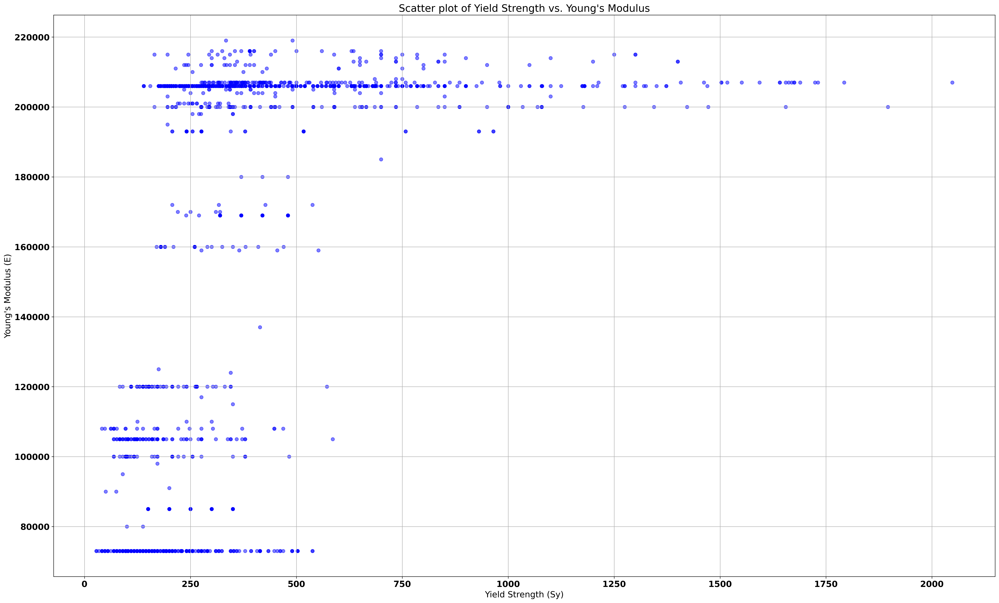

In [15]:
plt.scatter(df['Sy'], df['E'], c='blue', alpha=0.5)
plt.xlabel('Yield Strength (Sy)')
plt.ylabel("Young's Modulus (E)")
plt.title("Scatter plot of Yield Strength vs. Young's Modulus")
plt.grid(True)
plt.show()

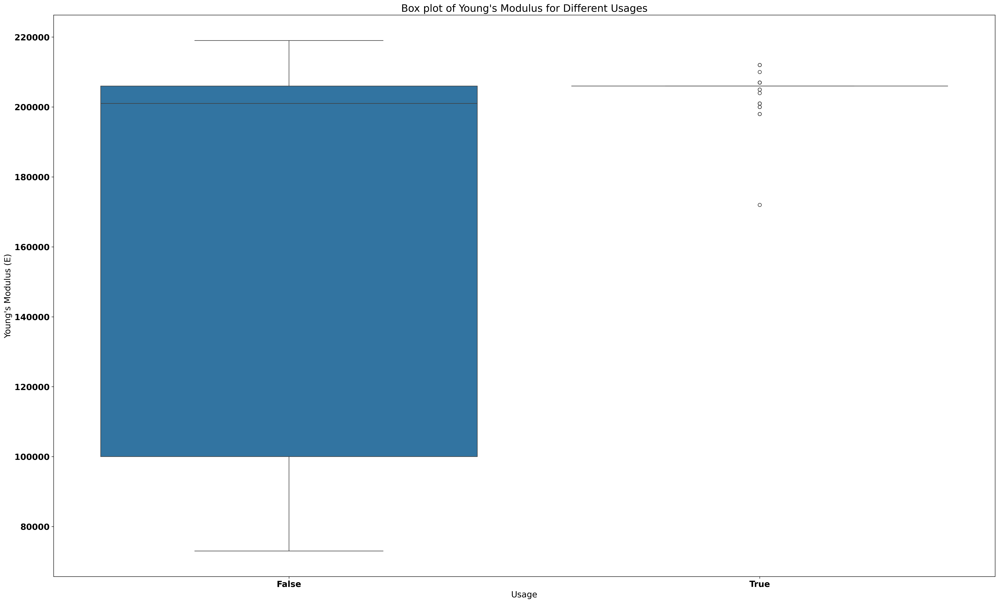

In [16]:
sns.boxplot(x='Use', y='E', data=df)
plt.xlabel('Usage')
plt.ylabel("Young's Modulus (E)")
plt.title("Box plot of Young's Modulus for Different Usages")
plt.xticks(ticks=[0, 1], labels=['False', 'True'])
plt.show()

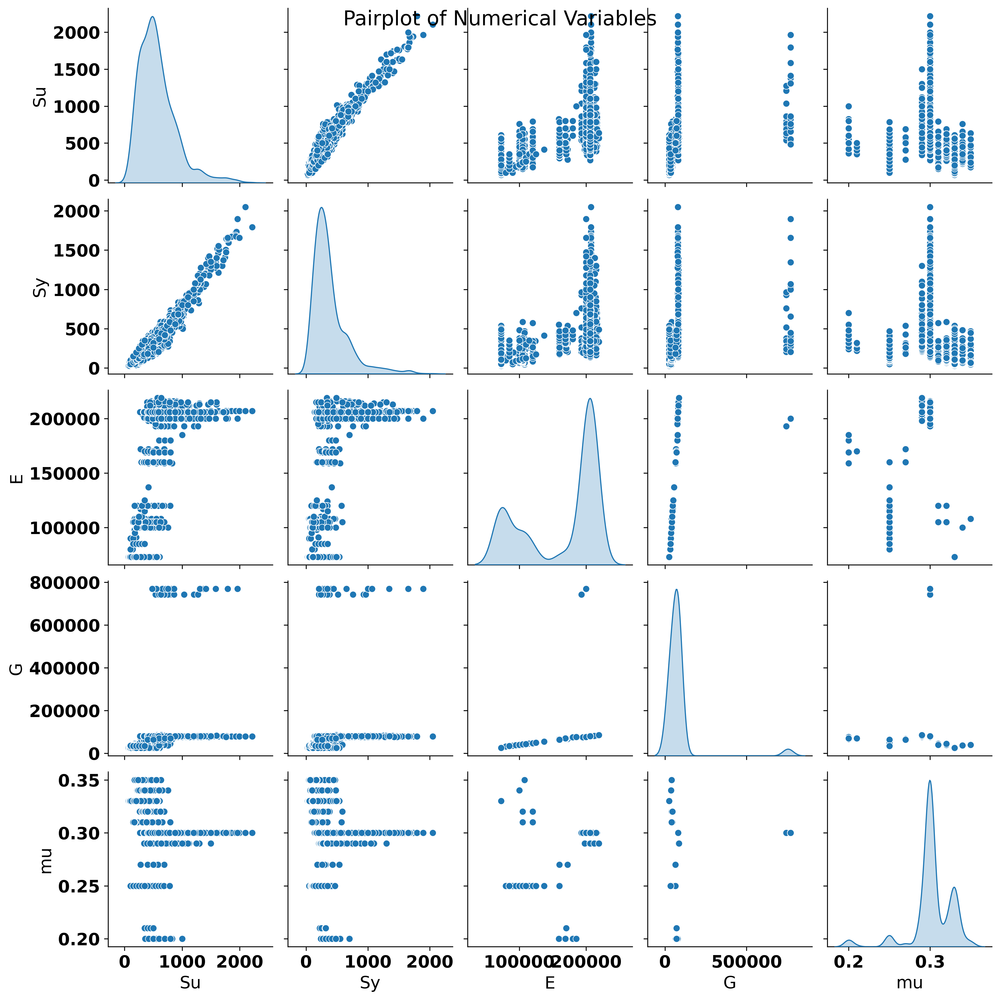

In [17]:
sns.pairplot(df.drop(columns=['Use', 'Ro']), diag_kind='kde')
plt.suptitle('Pairplot of Numerical Variables')
plt.show()

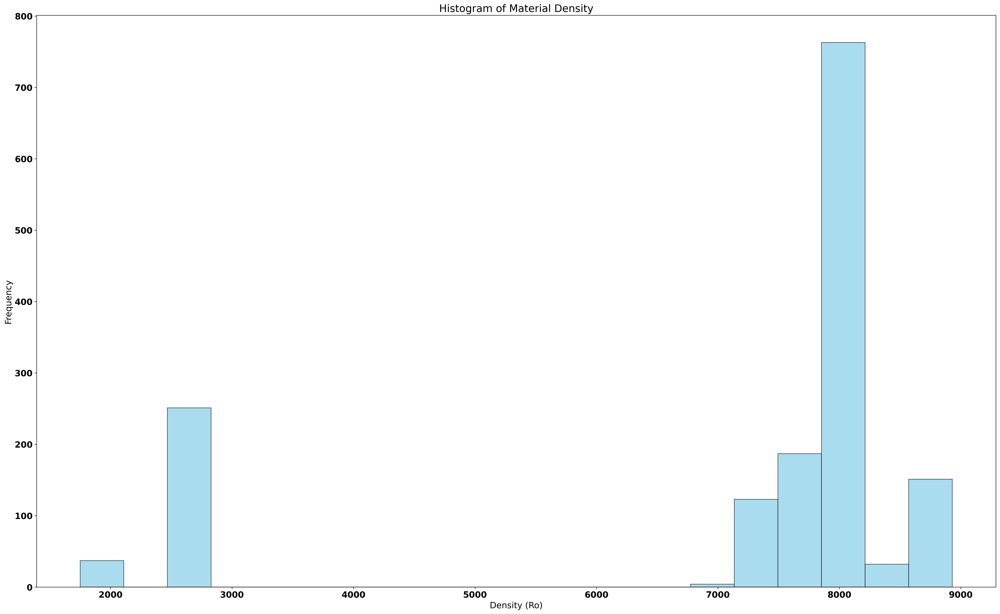

In [18]:
plt.hist(df['Ro'], bins=20, color='skyblue', edgecolor='black', alpha=0.7)
plt.xlabel('Density (Ro)')
plt.ylabel('Frequency')
plt.title('Histogram of Material Density')
plt.show()

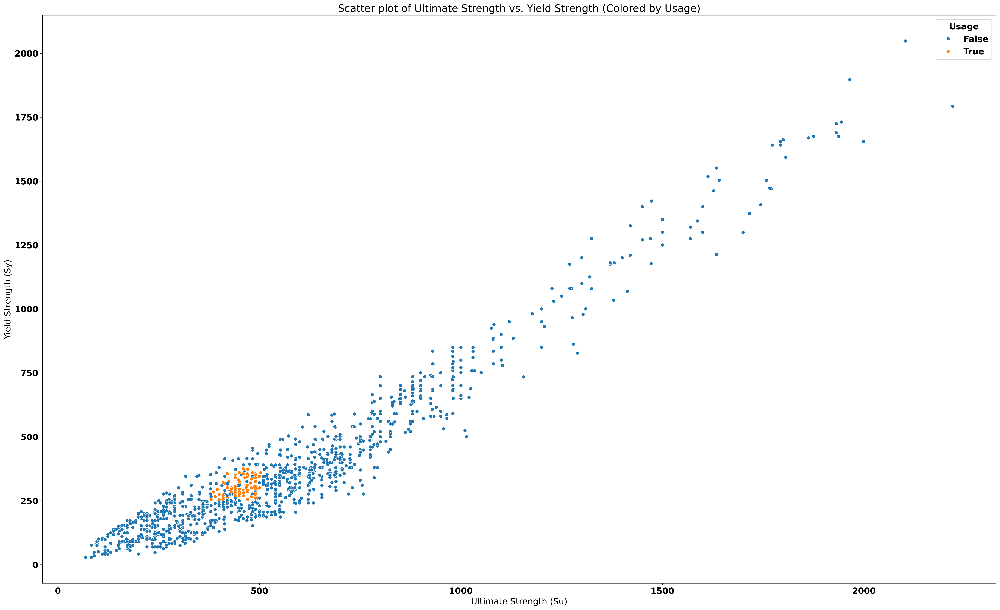

In [19]:
sns.scatterplot(x='Su', y='Sy', hue='Use', data=df)
plt.xlabel('Ultimate Strength (Su)')
plt.ylabel('Yield Strength (Sy)')
plt.title('Scatter plot of Ultimate Strength vs. Yield Strength (Colored by Usage)')
plt.legend(title='Usage')
plt.show()

In [20]:
def get_rating(row):
    conditions = [
        (438.3 <= row['Su'] <= 535.7, 318.6 <= row['Sy'] <= 389.4, 204930 <= row['E'] <= 209070, 71100 <= row['G'] <= 86900, 0.285 <= row['mu'] <= 0.315, 7467 <= row['Ro'] <= 8253),
        (389.6 <= row['Su'] <= 584.4, 283.2 <= row['Sy'] <= 424.8, 202860 <= row['E'] <= 211140, 63200 <= row['G'] <= 94800, 0.27 <= row['mu'] <= 0.33, 7074 <= row['Ro'] <= 8646),
        (340.9 <= row['Su'] <= 633.1, 247.8 <= row['Sy'] <= 460.2, 200790 <= row['E'] <= 213210, 55300 <= row['G'] <= 102700, 0.255 <= row['mu'] <= 0.345, 6681 <= row['Ro'] <= 9039),
        (292.2 <= row['Su'] <= 681.8, 212.4 <= row['Sy'] <= 495.6, 198720 <= row['E'] <= 215280, 47400 <= row['G'] <= 110600, 0.24 <= row['mu'] <= 0.36, 6288 <= row['Ro'] <= 9432)
    ]
    ratings = [5, 4, 3, 2]

    for rating, condition in zip(ratings, conditions):
        if all(condition):
            return rating
    return 1



In [21]:
df['rating'] = df.apply(get_rating, axis=1)
df

,Material,Su,Sy,E,G,mu,Ro,Use,rating
0,ANSI Steel SAE 1015 as-rolled,421,314,207000,79000,0.30,7860,True,4
1,ANSI Steel SAE 1015 normalized,424,324,207000,79000,0.30,7860,True,4
2,ANSI Steel SAE 1015 annealed,386,284,207000,79000,0.30,7860,True,3
3,ANSI Steel SAE 1020 as-rolled,448,331,207000,79000,0.30,7860,True,5
4,ANSI Steel SAE 1020 normalized,441,346,207000,79000,0.30,7860,True,5
...,...,...,...,...,...,...,...,...,...
1547,JIS Nodular cast iron,600,370,169000,70000,0.20,7160,False,1
1548,JIS Nodular cast iron,700,420,169000,70000,0.20,7160,False,1
1549,JIS Nodular cast iron,800,480,169000,70000,0.20,7160,False,1
1550,JIS Malleable cast iron,400,180,160000,64000,0.27,7160,False,1


In [22]:
df['Use'] = df['Use'].astype(int)


In [23]:
df

,Material,Su,Sy,E,G,mu,Ro,Use,rating
0,ANSI Steel SAE 1015 as-rolled,421,314,207000,79000,0.30,7860,1,4
1,ANSI Steel SAE 1015 normalized,424,324,207000,79000,0.30,7860,1,4
2,ANSI Steel SAE 1015 annealed,386,284,207000,79000,0.30,7860,1,3
3,ANSI Steel SAE 1020 as-rolled,448,331,207000,79000,0.30,7860,1,5
4,ANSI Steel SAE 1020 normalized,441,346,207000,79000,0.30,7860,1,5
...,...,...,...,...,...,...,...,...,...
1547,JIS Nodular cast iron,600,370,169000,70000,0.20,7160,0,1
1548,JIS Nodular cast iron,700,420,169000,70000,0.20,7160,0,1
1549,JIS Nodular cast iron,800,480,169000,70000,0.20,7160,0,1
1550,JIS Malleable cast iron,400,180,160000,64000,0.27,7160,0,1


In [24]:
df['Su/Sy'] = df['Su'] / df['Sy']

In [25]:
df

,Material,Su,Sy,E,G,mu,Ro,Use,rating,Su/Sy
0,ANSI Steel SAE 1015 as-rolled,421,314,207000,79000,0.30,7860,1,4,1.340764
1,ANSI Steel SAE 1015 normalized,424,324,207000,79000,0.30,7860,1,4,1.308642
2,ANSI Steel SAE 1015 annealed,386,284,207000,79000,0.30,7860,1,3,1.359155
3,ANSI Steel SAE 1020 as-rolled,448,331,207000,79000,0.30,7860,1,5,1.353474
4,ANSI Steel SAE 1020 normalized,441,346,207000,79000,0.30,7860,1,5,1.274566
...,...,...,...,...,...,...,...,...,...,...
1547,JIS Nodular cast iron,600,370,169000,70000,0.20,7160,0,1,1.621622
1548,JIS Nodular cast iron,700,420,169000,70000,0.20,7160,0,1,1.666667
1549,JIS Nodular cast iron,800,480,169000,70000,0.20,7160,0,1,1.666667
1550,JIS Malleable cast iron,400,180,160000,64000,0.27,7160,0,1,2.222222


In [26]:
#df = df[(df['Su'] - df['Su'].mean()).abs() < 3 * df['Su'].std()]

In [27]:
df

,Material,Su,Sy,E,G,mu,Ro,Use,rating,Su/Sy
0,ANSI Steel SAE 1015 as-rolled,421,314,207000,79000,0.30,7860,1,4,1.340764
1,ANSI Steel SAE 1015 normalized,424,324,207000,79000,0.30,7860,1,4,1.308642
2,ANSI Steel SAE 1015 annealed,386,284,207000,79000,0.30,7860,1,3,1.359155
3,ANSI Steel SAE 1020 as-rolled,448,331,207000,79000,0.30,7860,1,5,1.353474
4,ANSI Steel SAE 1020 normalized,441,346,207000,79000,0.30,7860,1,5,1.274566
...,...,...,...,...,...,...,...,...,...,...
1547,JIS Nodular cast iron,600,370,169000,70000,0.20,7160,0,1,1.621622
1548,JIS Nodular cast iron,700,420,169000,70000,0.20,7160,0,1,1.666667
1549,JIS Nodular cast iron,800,480,169000,70000,0.20,7160,0,1,1.666667
1550,JIS Malleable cast iron,400,180,160000,64000,0.27,7160,0,1,2.222222


In [28]:
from scipy.stats import pearsonr, ttest_ind, f_oneway, chi2_contingency
from sklearn.linear_model import LinearRegression


In [29]:
numeric_df = df.select_dtypes(include=np.number)

# Correlation Analysis
correlation_matrix = numeric_df.corr()

# T-Test or ANOVA - Example: Compare 'Su' across different 'Use' categories
t_statistic, p_value = ttest_ind(numeric_df[numeric_df['Use'] == 0]['Su'], numeric_df[numeric_df['Use'] == 1]['Su'])
# Alternatively, for ANOVA across multiple categories, replace 'Category' with another categorical column if available.
#f_statistic, p_value_anova = f_oneway(numeric_df[numeric_df['Category'] == 'A']['Su'], numeric_df[numeric_df['Category'] == 'B']['Su'], numeric_df[numeric_df['Category'] == 'C']['Su'])

# Chi-Square Test - Example: Test independence between 'Use' and 'Rating' categories
chi2_statistic, chi2_p_value, _, _ = chi2_contingency(pd.crosstab(df['Use'], df['rating']))


In [30]:
chi2_statistic

730.3100458187985

In [31]:
chi2_p_value

9.524748288438466e-157

In [32]:
X = numeric_df[['Sy', 'E', 'G', 'mu', 'Ro']]
y = numeric_df['Su']
regressor = LinearRegression()
regressor.fit(X, y)
coefficients = regressor.coef_
intercept = regressor.intercept_

print("Correlation Matrix:")
print(correlation_matrix)
print("\nT-Test p-value:", p_value)
# print("ANOVA p-value:", p_value_anova)
print("\nChi-Square Test p-value:", chi2_p_value)
print("\nLinear Regression Coefficients:", coefficients)
print("Linear Regression Intercept:", intercept)

Correlation Matrix:
              Su        Sy         E         G        mu        Ro       Use  \
Su      1.000000  0.957355  0.594539  0.254560 -0.239649  0.407968 -0.108608   
Sy      0.957355  1.000000  0.473113  0.179317 -0.190340  0.274133 -0.089184   
E       0.594539  0.473113  1.000000  0.279714 -0.446784  0.716698  0.225466   
G       0.254560  0.179317  0.279714  1.000000 -0.108715  0.222955 -0.014871   
mu     -0.239649 -0.190340 -0.446784 -0.108715  1.000000 -0.400145 -0.055154   
Ro      0.407968  0.274133  0.716698  0.222955 -0.400145  1.000000  0.132557   
Use    -0.108608 -0.089184  0.225466 -0.014871 -0.055154  0.132557  1.000000   
rating -0.097881 -0.114697  0.384794 -0.024428 -0.088895  0.224097  0.663115   
Su/Sy  -0.288660 -0.471049 -0.085077  0.051664  0.158122  0.212519 -0.083880   

          rating     Su/Sy  
Su     -0.097881 -0.288660  
Sy     -0.114697 -0.471049  
E       0.384794 -0.085077  
G      -0.024428  0.051664  
mu     -0.088895  0.158122  
Ro   

In [33]:
z_scores = (numeric_df - numeric_df.mean()) / numeric_df.std()

threshold = 3

outliers = (z_scores.abs() > threshold)

print("Count of outliers in each column:")
print(outliers.sum())

print("\nRows containing outliers:")
print(df[outliers.any(axis=1)])

Count of outliers in each column:
Su         32
Sy         40
E           0
G          51
mu         38
Ro          0
Use       135
rating     51
Su/Sy      26
dtype: int64

Rows containing outliers:
                            Material   Su   Sy       E      G   mu    Ro  Use  \
0      ANSI Steel SAE 1015 as-rolled  421  314  207000  79000  0.3  7860    1   
1     ANSI Steel SAE 1015 normalized  424  324  207000  79000  0.3  7860    1   
2       ANSI Steel SAE 1015 annealed  386  284  207000  79000  0.3  7860    1   
3      ANSI Steel SAE 1020 as-rolled  448  331  207000  79000  0.3  7860    1   
4     ANSI Steel SAE 1020 normalized  441  346  207000  79000  0.3  7860    1   
...                              ...  ...  ...     ...    ...  ...   ...  ...   
1500                   JIS JIS S25C   480  300  206000  80000  0.3  7860    1   
1546          JIS Nodular cast iron   500  320  169000  70000  0.2  7160    0   
1547          JIS Nodular cast iron   600  370  169000  70000  0.2  716

In [34]:
# Convert DataFrame to NumPy array
numeric_array = numeric_df.to_numpy()

# Replace masked values with NaN
numeric_array = np.where(np.isinf(numeric_array), np.nan, numeric_array)

# Check for NaN values
nan_mask = np.isnan(numeric_array)

# Count NaN values in each column
nan_count = np.sum(nan_mask, axis=0)

# Drop rows containing NaN values
numeric_array = numeric_array[~np.any(nan_mask, axis=1)]

# Check the count of outliers in each column after processing
outliers_after_processing = (numeric_array - np.mean(numeric_array, axis=0)) / np.std(numeric_array, axis=0) > threshold
print("Count of outliers in each column after processing:")
print(np.sum(outliers_after_processing, axis=0))


Count of outliers in each column after processing:
[ 32  40   0  51   0   0 135  51  26]


In [35]:
df

,Material,Su,Sy,E,G,mu,Ro,Use,rating,Su/Sy
0,ANSI Steel SAE 1015 as-rolled,421,314,207000,79000,0.30,7860,1,4,1.340764
1,ANSI Steel SAE 1015 normalized,424,324,207000,79000,0.30,7860,1,4,1.308642
2,ANSI Steel SAE 1015 annealed,386,284,207000,79000,0.30,7860,1,3,1.359155
3,ANSI Steel SAE 1020 as-rolled,448,331,207000,79000,0.30,7860,1,5,1.353474
4,ANSI Steel SAE 1020 normalized,441,346,207000,79000,0.30,7860,1,5,1.274566
...,...,...,...,...,...,...,...,...,...,...
1547,JIS Nodular cast iron,600,370,169000,70000,0.20,7160,0,1,1.621622
1548,JIS Nodular cast iron,700,420,169000,70000,0.20,7160,0,1,1.666667
1549,JIS Nodular cast iron,800,480,169000,70000,0.20,7160,0,1,1.666667
1550,JIS Malleable cast iron,400,180,160000,64000,0.27,7160,0,1,2.222222


In [36]:
#df=numeric_df_processed.copy()

In [37]:
df.drop(["Material"]  , axis=1 , inplace=True)

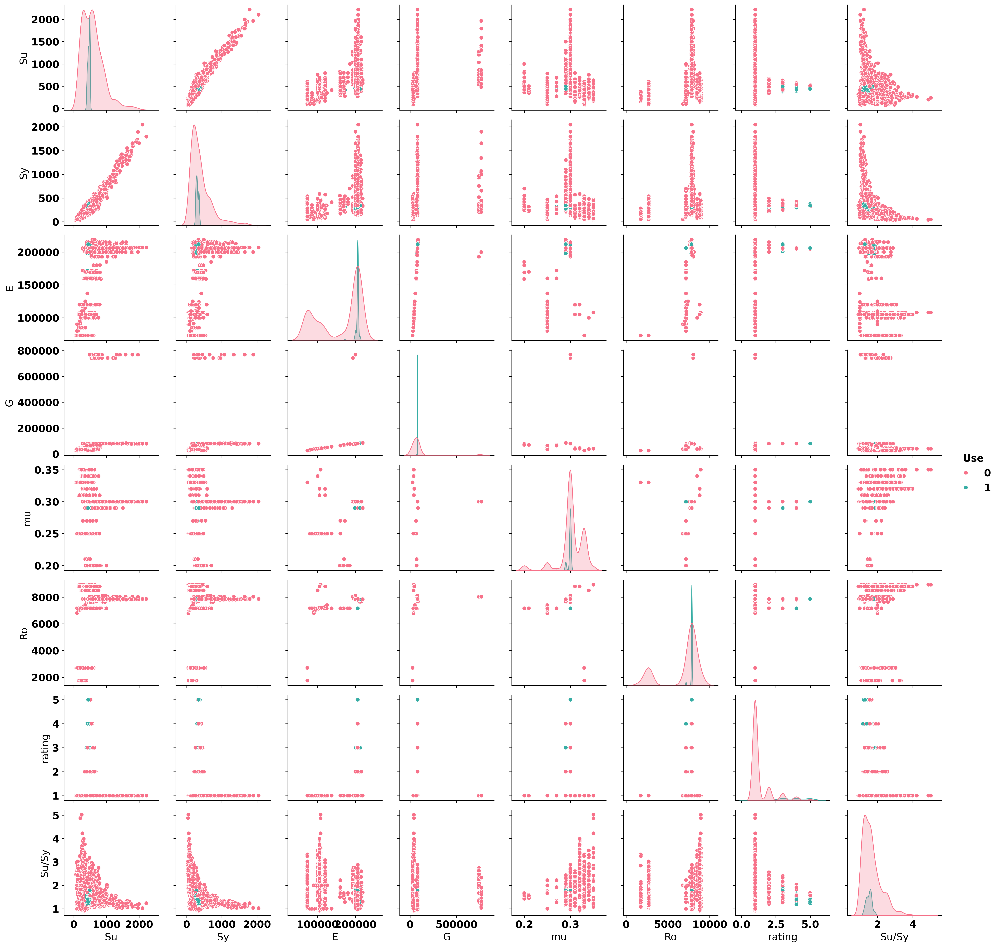

In [38]:
sns.pairplot(df, hue='Use', palette='husl')
plt.show()

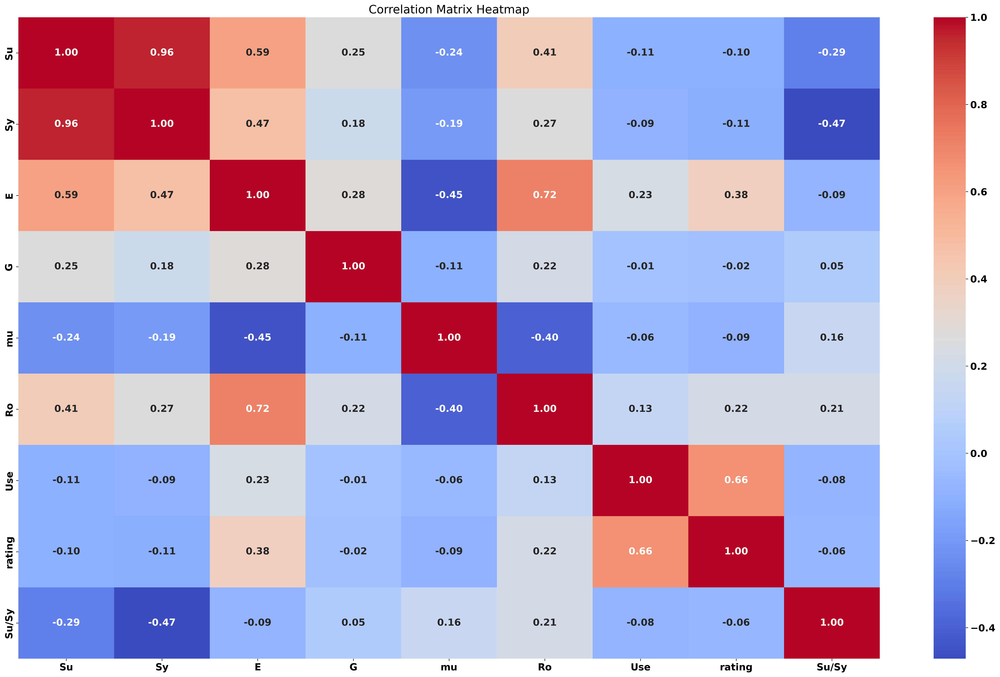

In [39]:
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Heatmap')
plt.show()

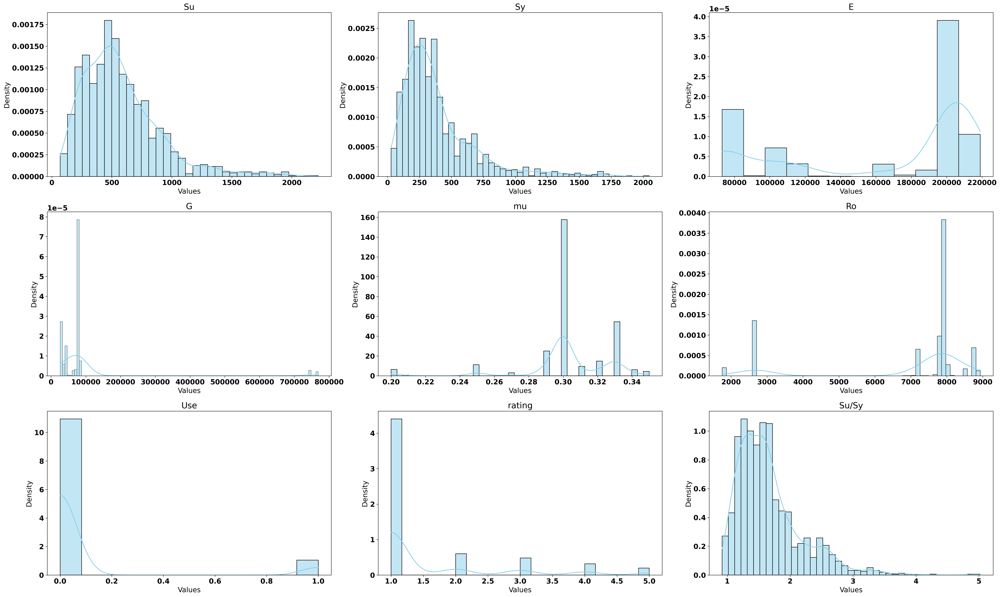

In [40]:
for i, column in enumerate(df.columns):
    plt.subplot(3, 3, i + 1)
    sns.histplot(df[column], kde=True, color='skyblue', stat='density')
    plt.title(column)
    plt.xlabel('Values')
    plt.ylabel('Density')
plt.tight_layout()
plt.show()

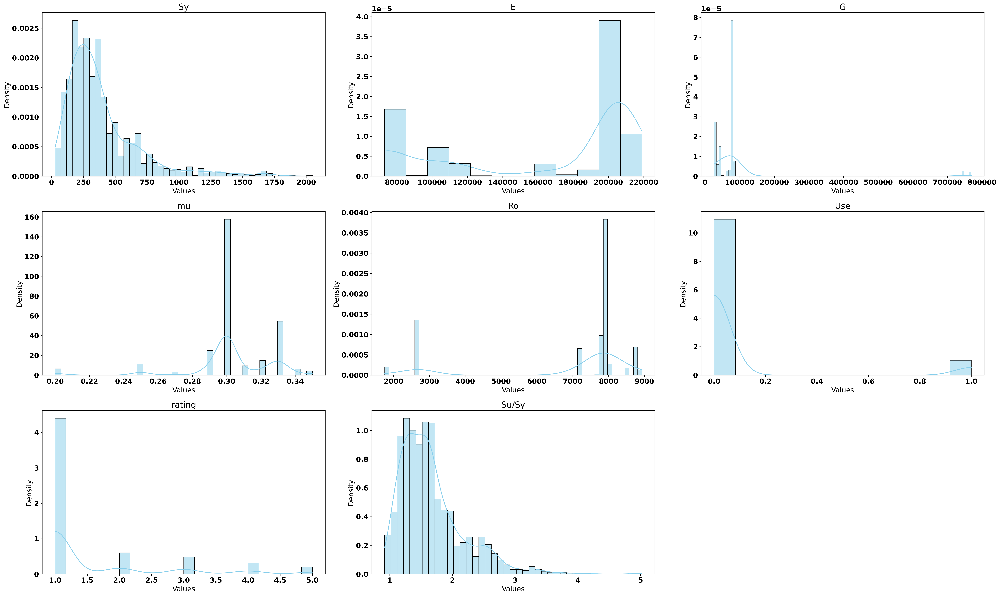

In [41]:
for i, column in enumerate(df.columns[1:]):
    plt.subplot(3, 3, i + 1)
    sns.histplot(df[column], kde=True, color='skyblue', stat='density')
    plt.title(column)
    plt.xlabel('Values')
    plt.ylabel('Density')
plt.tight_layout()
plt.show()

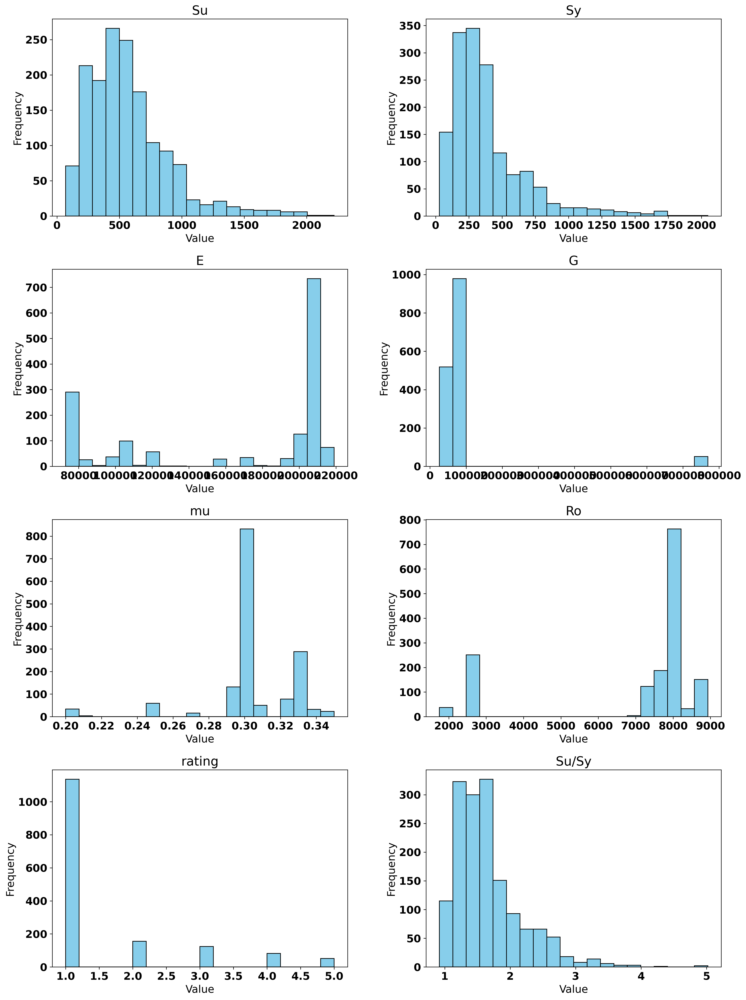

In [42]:
columns_to_plot = ['Su', 'Sy', 'E', 'G', 'mu', 'Ro', 'rating', 'Su/Sy']

fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15, 20))

# Plotting each column
for i, column in enumerate(columns_to_plot):
    ax = axes.flatten()[i]
    ax.hist(df[column], bins=20, color='skyblue', edgecolor='black')
    ax.set_title(column)
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

# Adjusting layout
plt.tight_layout()
plt.show()

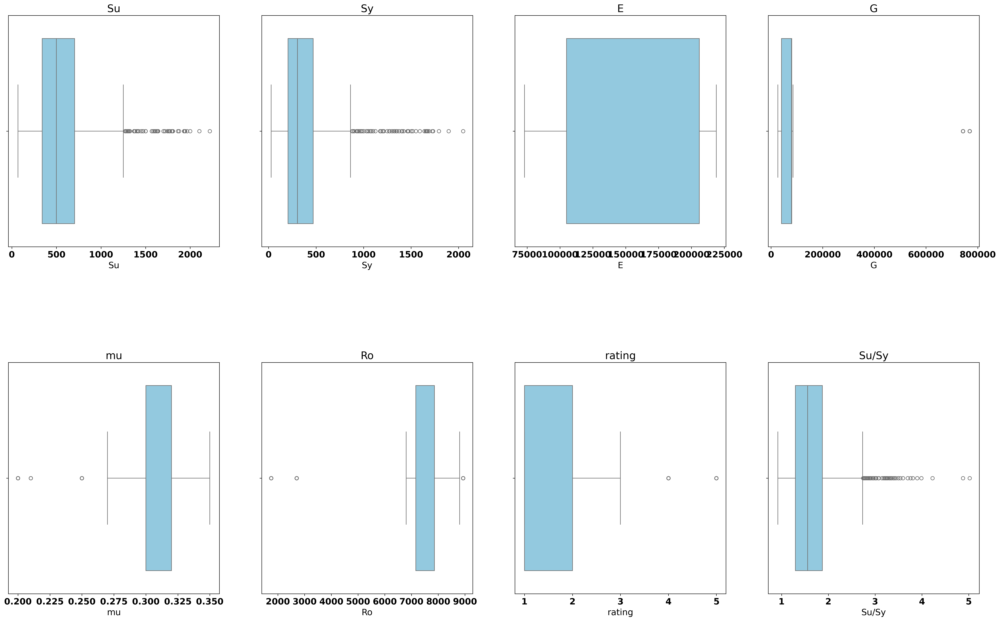

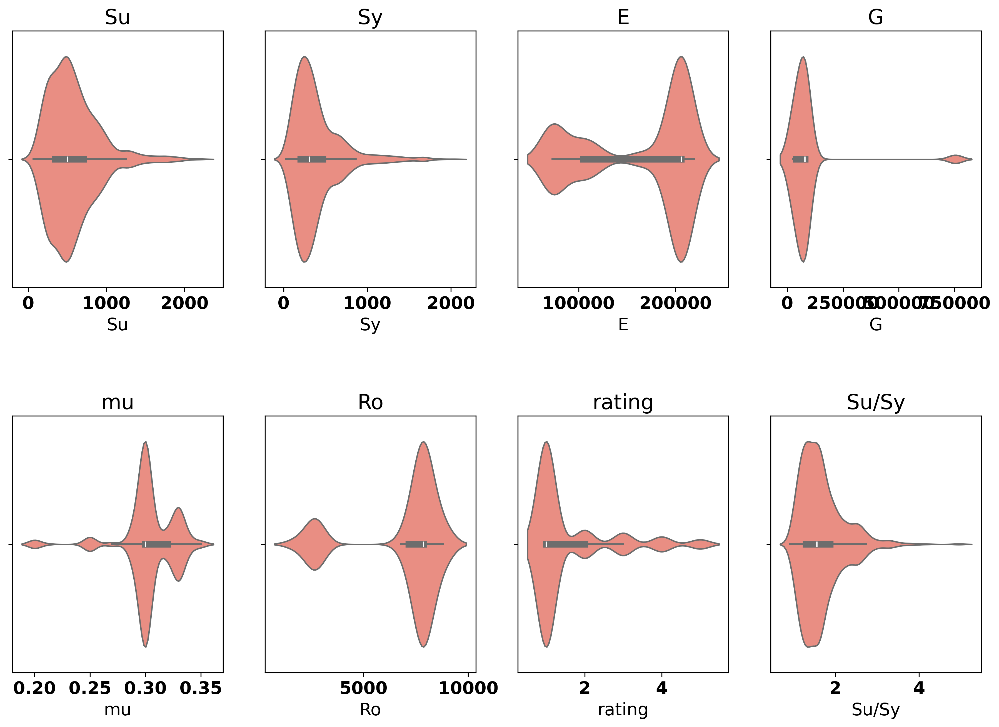

In [43]:
plt.subplots_adjust(hspace=0.5)
for i, column in enumerate(columns_to_plot, 1):
    plt.subplot(2, 4, i)
    sns.boxplot(x=df[column], color='skyblue')
    plt.title(column)
plt.figure(figsize=(15, 10))
plt.subplots_adjust(hspace=0.5)
for i, column in enumerate(columns_to_plot, 1):
    plt.subplot(2, 4, i)
    sns.violinplot(x=df[column], color='salmon')
    plt.title(column)

plt.show()

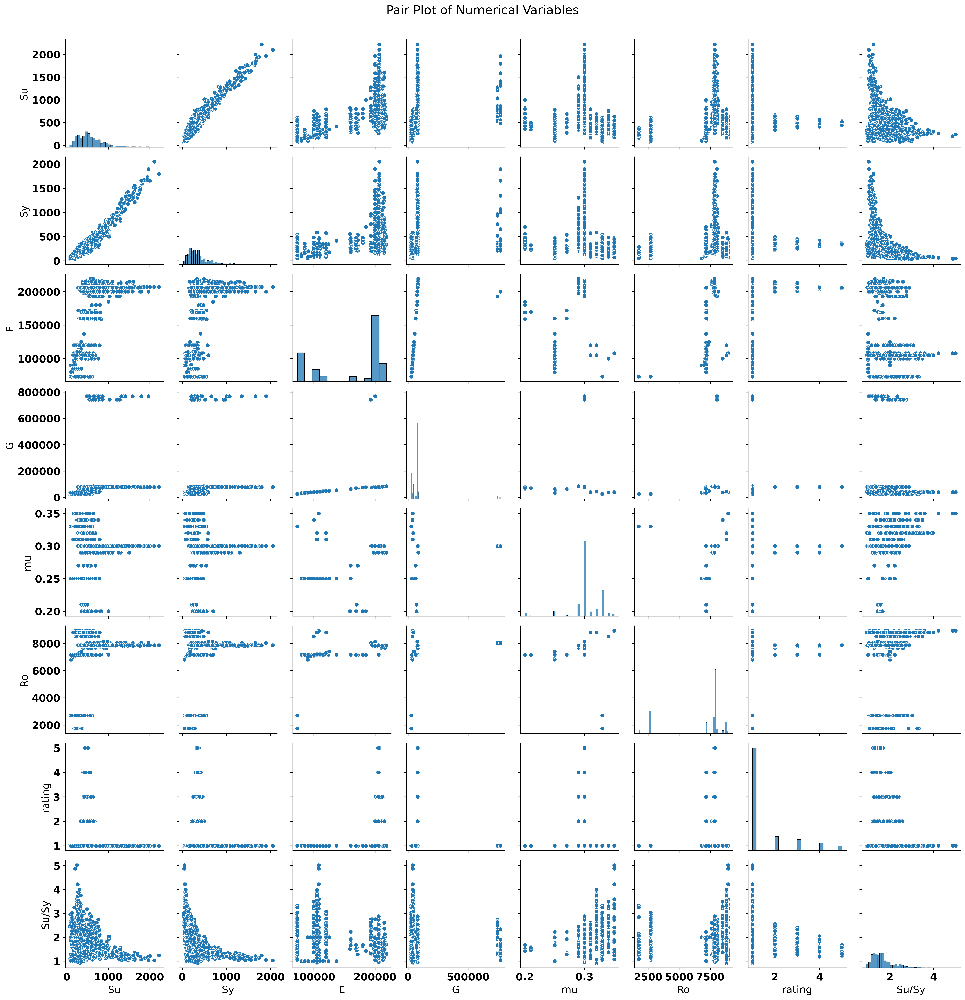

In [44]:
sns.pairplot(df, vars=['Su', 'Sy', 'E', 'G', 'mu', 'Ro', 'rating', 'Su/Sy'], kind='scatter')
plt.suptitle('Pair Plot of Numerical Variables', y=1.02)
plt.show()

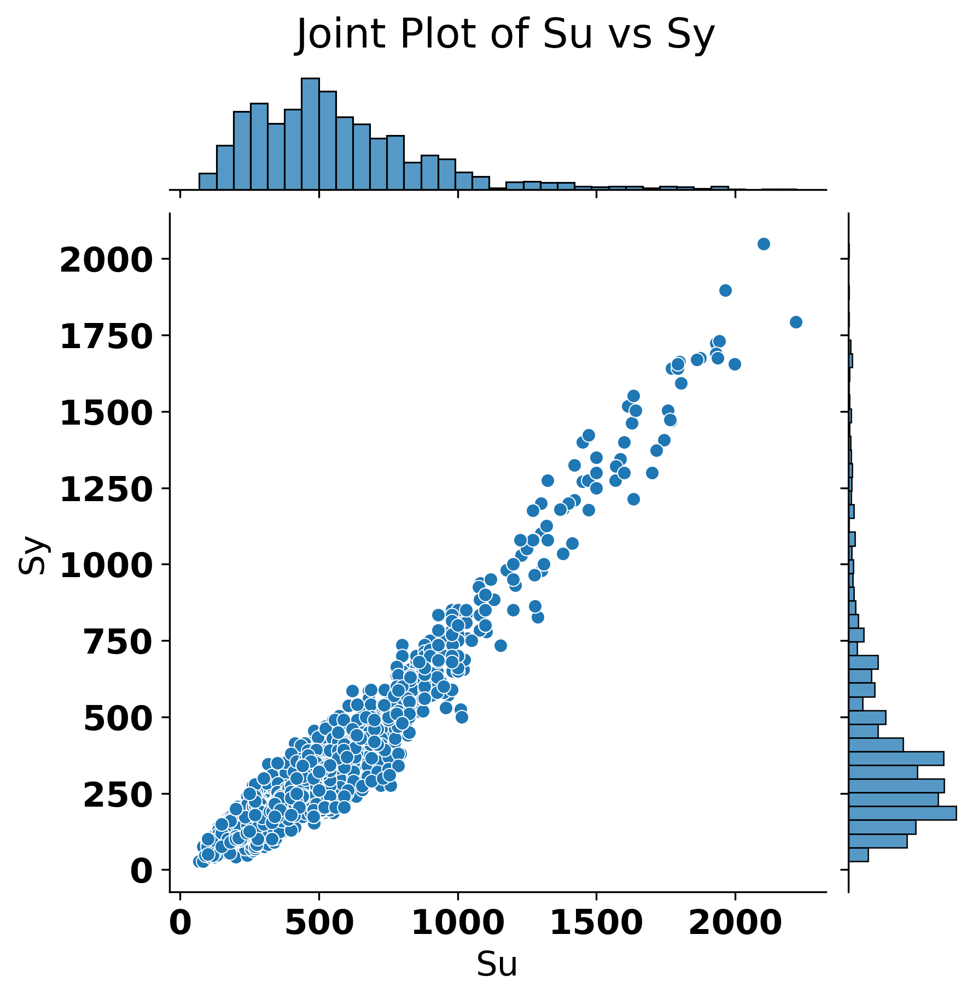

In [45]:
sns.jointplot(data=df, x='Su', y='Sy', kind='scatter')
plt.suptitle('Joint Plot of Su vs Sy', y=1.02)
plt.show()


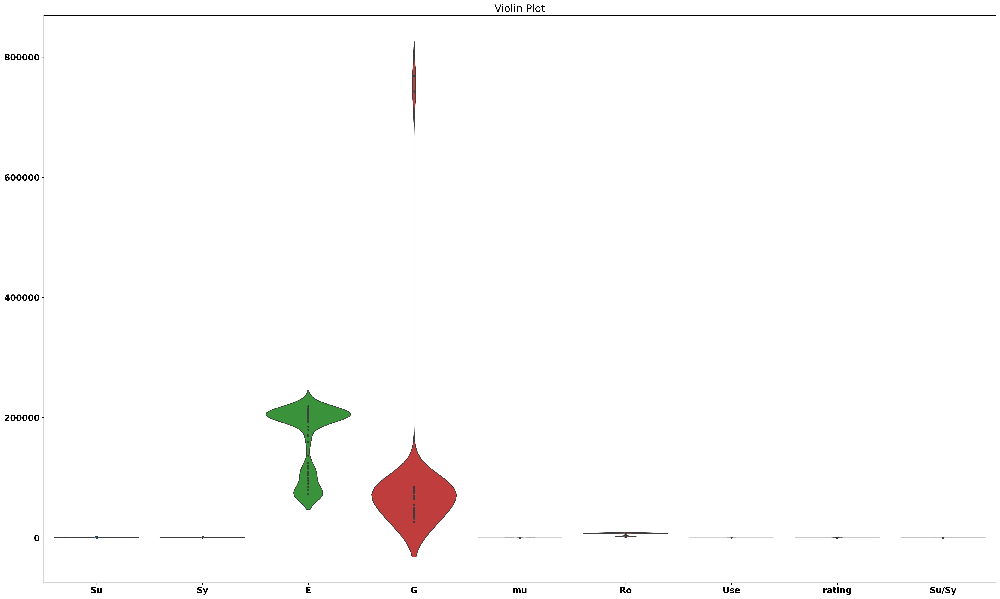

In [46]:
sns.violinplot(data=df, inner='point')
plt.title('Violin Plot')
plt.show()

In [47]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

In [48]:
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df[['Su', 'Sy', 'E', 'G', 'mu']])

In [49]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split

In [50]:
pca = PCA(n_components=3)  # Choose number of principal components
principal_components = pca.fit_transform(scaled_features)
principal_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3'])

In [51]:
df

,Su,Sy,E,G,mu,Ro,Use,rating,Su/Sy
0,421,314,207000,79000,0.30,7860,1,4,1.340764
1,424,324,207000,79000,0.30,7860,1,4,1.308642
2,386,284,207000,79000,0.30,7860,1,3,1.359155
3,448,331,207000,79000,0.30,7860,1,5,1.353474
4,441,346,207000,79000,0.30,7860,1,5,1.274566
...,...,...,...,...,...,...,...,...,...
1547,600,370,169000,70000,0.20,7160,0,1,1.621622
1548,700,420,169000,70000,0.20,7160,0,1,1.666667
1549,800,480,169000,70000,0.20,7160,0,1,1.666667
1550,400,180,160000,64000,0.27,7160,0,1,2.222222


In [ ]:
sns.jointplot(x='Su', y='Sy', data=df, kind='hex')
sns.residplot(x='E', y='G', data=df, scatter_kws={'s': 80})
sns.swarmplot(x='Use', y='rating', hue='Use', data=df)
plt.show()

In [ ]:
g = sns.PairGrid(df)
g.map_upper(sns.scatterplot)
g.map_diag(sns.histplot, kde=True)
g.map_lower(sns.kdeplot)

In [ ]:
sns.clustermap(df.corr(), cmap='coolwarm', annot=True)
g = sns.FacetGrid(df, col='Use', hue='Use')
g.map(sns.scatterplot, 'Su', 'Sy')
sns.kdeplot(data=df['E'], shade=True)
plt.show()

In [ ]:
X = df.drop(columns=['Use'])
y = df['Use']

oversampler = SMOTE(sampling_strategy='auto', random_state=42)
X_resampled, y_resampled = oversampler.fit_resample(X, y)

resampled_df = pd.DataFrame(X_resampled, columns=X.columns)
resampled_df['Use'] = y_resampled

print(resampled_df)

In [ ]:
resampled_df["Use"].value_counts()

In [ ]:
Data

In [ ]:
df

In [ ]:
plt.scatter(df['Su'], df['Sy'], color='skyblue', alpha=0.5)
plt.xlabel('Su')
plt.ylabel('Sy')
plt.title('Relationship between Su and Sy')
plt.grid(True)
plt.show()

In [ ]:
plt.hist(df['Su'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Su')
plt.ylabel('Frequency')
plt.title('Distribution of Su')
plt.grid(True)
plt.show()

In [ ]:
sns.boxplot(x=df['Use'], y=df['Su'])
plt.xlabel('Use')
plt.ylabel('Su')
plt.title('Box plot of Su by Use')
plt.show()

In [ ]:
sns.pairplot(df[['Su', 'Sy', 'E', 'G', 'mu']])
plt.title('Pairwise Relationships')
plt.show()


In [ ]:
sns.barplot(x='Use', y='Su', data=df)
plt.xlabel('Use')
plt.ylabel('Su')
plt.title('Average Su by Use')
plt.show()

In [ ]:
corr = df.corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

In [ ]:
sns.jointplot(x='Su', y='Sy', data=df, kind='hex')
plt.xlabel('Su')
plt.ylabel('Sy')
plt.title('Joint Plot of Su vs. Sy')
plt.show()

In [ ]:
sns.clustermap(df.corr(), cmap='coolwarm', annot=True)
plt.title('Clustermap of Correlation Matrix')
plt.show()

In [ ]:
sns.jointplot(x='Su', y='Sy', data=df, kind='kde')
plt.xlabel('Su')
plt.ylabel('Sy')
plt.title('Joint Distribution Plot of Su vs. Sy')
plt.show()

In [ ]:
g = sns.PairGrid(df, hue='Use')
g.map_diag(sns.kdeplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()
plt.subplots_adjust(top=0.9)
g.fig.suptitle('PairGrid of Variables with KDE Diagonals')
plt.show()

In [ ]:
fig, axs = plt.subplots(2, 3, figsize=(12, 8))
variables = ['Su', 'Sy', 'E', 'G', 'mu', 'Ro']
for i, var in enumerate(variables):
    sns.histplot(df[var], ax=axs[i//3, i%3], kde=True)
    axs[i//3, i%3].set_title(f'Distribution of {var}')
plt.tight_layout()
plt.show()

In [ ]:
g = sns.PairGrid(df)
g.map_diag(sns.kdeplot)
g.map_offdiag(sns.scatterplot)
plt.subplots_adjust(top=0.9)
g.fig.suptitle('PairGrid with KDE Diagonals')
plt.show()

In [ ]:
df

In [ ]:
g = sns.PairGrid(df)
g.map_diag(sns.kdeplot)
g.map_offdiag(sns.scatterplot)
plt.subplots_adjust(top=0.9)
g.fig.suptitle('PairGrid with KDE Diagonals')
plt.show()